# Spatial correlation of the gene expression in ST data

## imports

In [1]:
import numpy as np
import pandas as pd
import anndata as ad
import scanpy as sc
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from scipy.sparse import csr_matrix
from pathlib import Path

## get AnnData object from csv

In [2]:
# Gene names from the MERFISH codebook (shared across all splits)
codebook = pd.read_csv(
    "/home/asalmona/Documents/Ricci/data/perturb-FISH/extras/tumors/processed/sample1/MERFISH/codebook_0_ImmunOncology_0.csv"
)
gene_names = codebook["name"].values  # length 550, 50 last genes are control buyt still

# - coordinates.csv has two columns (x,y) and no header row
# - allcellsPerturbationTable.csv is a *matrix* (many columns); don't force it into two columns
perturb = pd.read_csv(
    "/home/asalmona/Documents/Ricci/code/LUNA_perturb/Spatial-Transcriptomics-and-Perturbations-Modeling/data_splits/original/allcellsPerturbationTable.csv",
    header=None,
)
merfish = pd.read_csv(
    "/home/asalmona/Documents/Ricci/code/LUNA_perturb/Spatial-Transcriptomics-and-Perturbations-Modeling/data_splits/original/merfishcounttable.csv",
    header=None,
)
coords = pd.read_csv(
    "/home/asalmona/Documents/Ricci/code/LUNA_perturb/Spatial-Transcriptomics-and-Perturbations-Modeling/data_splits/original/coordinates.csv",
    header=None,
    names=["x", "y"],
)

# we're not splitting the data but the code is designed to handle splits

In [3]:
# properly read the information from merfish.csv
cell_index   = merfish.iloc[:, 0].values
total_counts = merfish.iloc[:, 1].values
cell_volume  = merfish.iloc[:, 2].values
expr_matrix  = csr_matrix(merfish.iloc[:, 3:].values) # main matrix

In [4]:
# build the obs and var information matrices
var = pd.DataFrame({
    "gene_name": gene_names,
    "is_blank": [n.startswith("Blank") for n in gene_names],
}, index=gene_names)


obs = pd.DataFrame({
    "cell_index":   cell_index,
    "total_counts": total_counts,
    "cell_volume":  cell_volume,
    "n_grna":       perturb.sum(axis=1).values, # number of gRNAs per cell
    }, index=[f"cell_{i}" for i in cell_index])


In [5]:
adata = ad.AnnData(X=expr_matrix, obs=obs, var=var.copy())
adata.obsm["spatial"] = coords[["x", "y"]].values
adata.raw = adata

In [6]:
print(f"\nBuilt {len(adata)} cells in the object.")


Built 187215 cells in the object.


In [7]:
print(adata)


AnnData object with n_obs × n_vars = 187215 × 550
    obs: 'cell_index', 'total_counts', 'cell_volume', 'n_grna'
    var: 'gene_name', 'is_blank'
    obsm: 'spatial'


## initial plots

/tmp/ipykernel_254523/1783754743.py:2: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color="GZMA", spot_size=100, alpha=0.7, frameon=False, cmap="Reds", vmax=6)


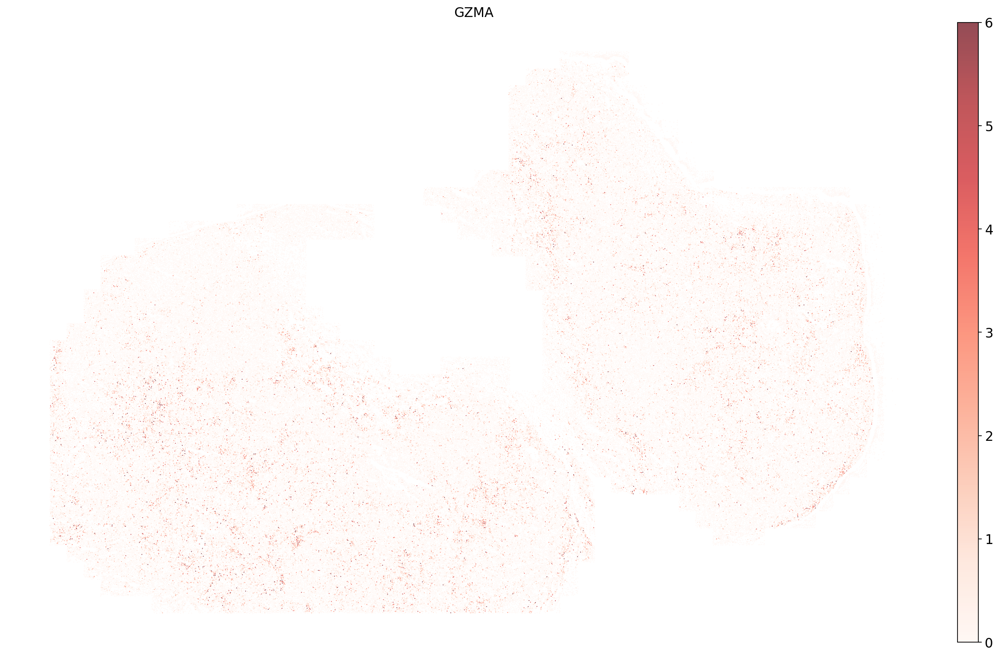

In [8]:
sc.settings.set_figure_params(figsize=(32, 12))
sc.pl.spatial(adata, color="GZMA", spot_size=100, alpha=0.7, frameon=False, cmap="Reds", vmax=6)

/tmp/ipykernel_254523/528151517.py:1: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color="PTPRC", spot_size=200, alpha=0.7, frameon=False, cmap="Reds", vmax=6)


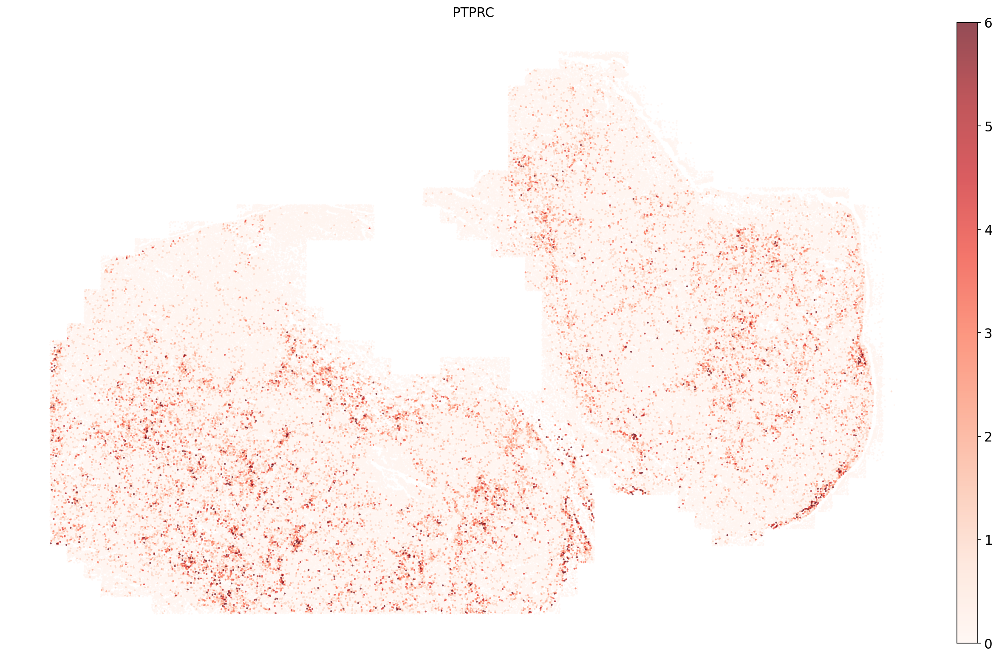

In [9]:
sc.pl.spatial(adata, color="PTPRC", spot_size=200, alpha=0.7, frameon=False, cmap="Reds", vmax=6)

In [11]:
# plot the max and min values of coordinates
print(f"Max x: {adata.obsm['spatial'][:, 0].max()}, Min x: {adata.obsm['spatial'][:, 0].min()}")
print(f"Max y: {adata.obsm['spatial'][:, 1].max()}, Min y: {adata.obsm['spatial'][:, 1].min()}")


Max x: 91986.4805234258, Min x: 36.8511516731856
Max y: 153204.409237113, Min y: 92171.3241428066


In [37]:
# bounding box 
x_min, x_max = 50000, 90000
y_min, y_max = 105000, 135000

# Extract the spatial array for easier reading
coords = adata.obsm['spatial']

# boolean mask 
mask_x = (coords[:, 0] >= x_min) & (coords[:, 0] <= x_max)
mask_y = (coords[:, 1] >= y_min) & (coords[:, 1] <= y_max)
valid_cells_mask = mask_x & mask_y

# zoomed-in version, can be used as an array for the mask
adata_zoomed = adata[valid_cells_mask].copy()

/tmp/ipykernel_254523/1059470358.py:1: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata_zoomed, color="FN1", spot_size=150, alpha=0.5, frameon=False, cmap="Reds", vmax=6)


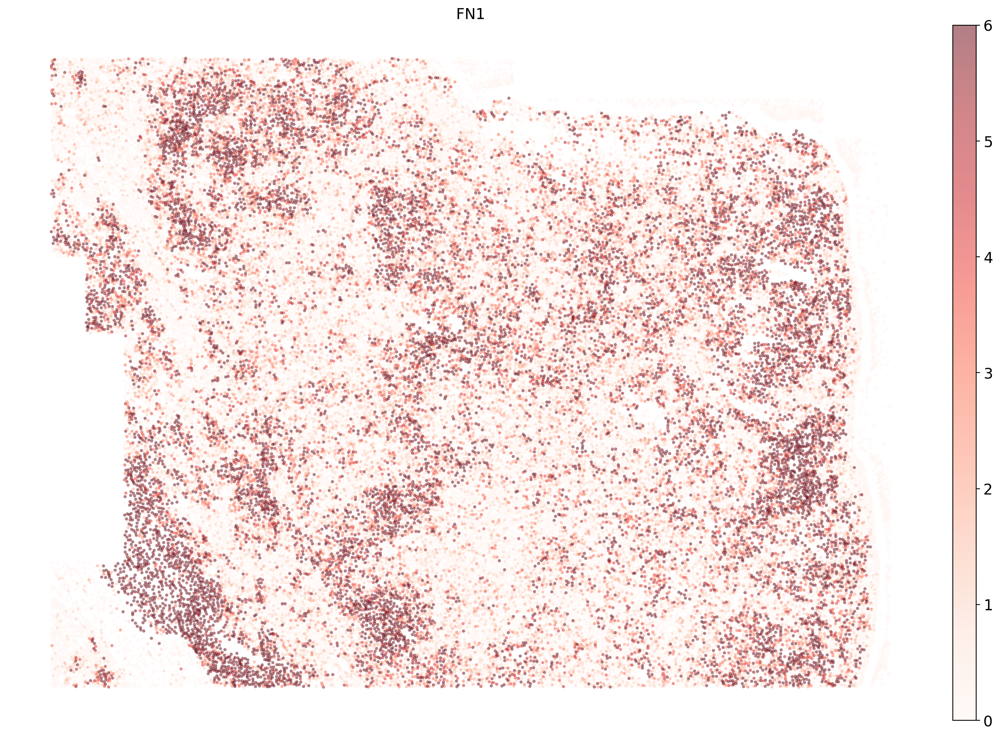

In [38]:
sc.pl.spatial(adata_zoomed, color="FN1", spot_size=150, alpha=0.5, frameon=False, cmap="Reds", vmax=6)

Grid shape: 204 rows (y), 307 cols (x)
x: 36.9 to 91986.5 (307 bins of ~299.5)
y: 92171.3 to 153204.4 (204 bins of ~299.2)


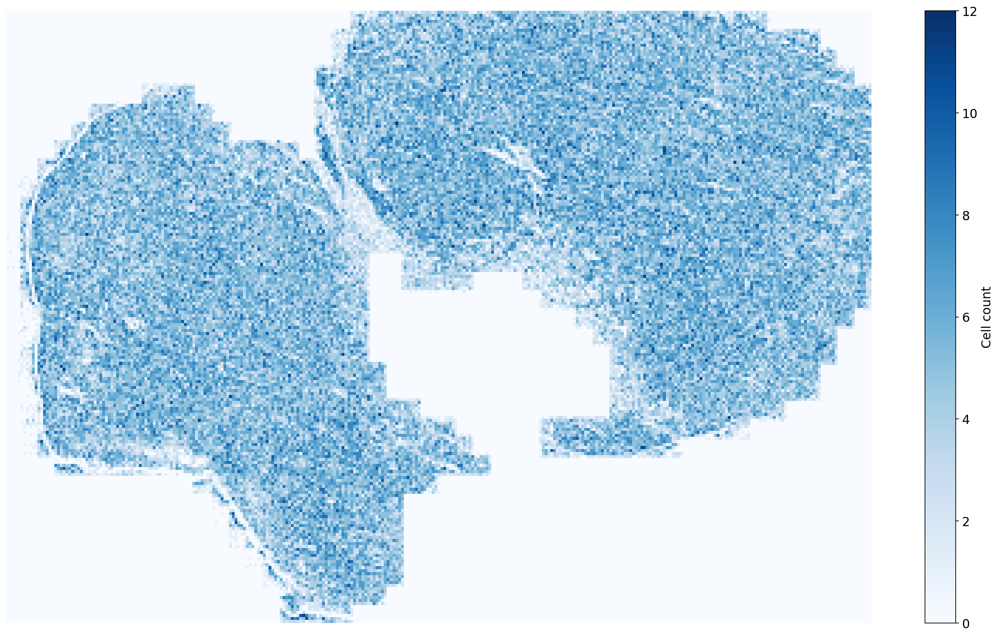

In [14]:
# Calculate cell density keeping proportions of the real coordinate extents, using a fixed step

# Define bounds of the region
x_min, x_max = coords[:, 0].min(), coords[:, 0].max()
y_min, y_max = coords[:, 1].min(), coords[:, 1].max()

# Set the global step (bin size)
global_step = 300

# Calculate the number of columns (x direction) and rows (y direction) by dividing the length of each axis by the step 
grid_x = int(np.ceil((x_max - x_min) / global_step))
grid_y = int(np.ceil((y_max - y_min) / global_step))

# The bin size in each direction (may be slightly less than global_step at the rightmost/topmost bin)
step_x = (x_max - x_min) / grid_x
step_y = (y_max - y_min) / grid_y

print(f"Grid shape: {grid_y} rows (y), {grid_x} cols (x)")
print(f"x: {x_min:.1f} to {x_max:.1f} ({grid_x} bins of ~{step_x:.1f})")
print(f"y: {y_min:.1f} to {y_max:.1f} ({grid_y} bins of ~{step_y:.1f})")

# Initialize the density array with the calculated shape
density = np.zeros((grid_y, grid_x))

# Assign cells to grid bins
x_indices = np.floor((coords[:, 0] - x_min) / step_x).astype(int)
y_indices = np.floor((coords[:, 1] - y_min) / step_y).astype(int)

# Clip indices to make sure all values are valid indices within bounds
x_indices = np.clip(x_indices, 0, grid_x - 1)
y_indices = np.clip(y_indices, 0, grid_y - 1)

# Count the number of cells in each bin
for xi, yi in zip(x_indices, y_indices):
    density[yi, xi] += 1

custom_figsize = (17.35, 10.2)  

fig, ax = plt.subplots(figsize=custom_figsize)
im = ax.imshow(
    density, 
    cmap="Blues", 
    interpolation='none',
    origin='lower',
    extent=[x_min, x_max, y_min, y_max],  # Use the real coordinate extents
    aspect='auto'  # Proportionality of coordinate system guaranteed by extent
)
# Invert the x-axis if necessary to match spatial orientation
ax.set_xlim(x_max, x_min)

# Hide axis and ticks for a clean output
ax.axis('off')

plt.colorbar(im, ax=ax, label="Cell count")
plt.tight_layout()
plt.show()


## spatial correlations

0.03453915508705715
0.21661332141985312


(<Figure size 1388x816 with 2 Axes>,
 <Axes: >,
 <matplotlib.image.AxesImage at 0x715a0a329f60>)

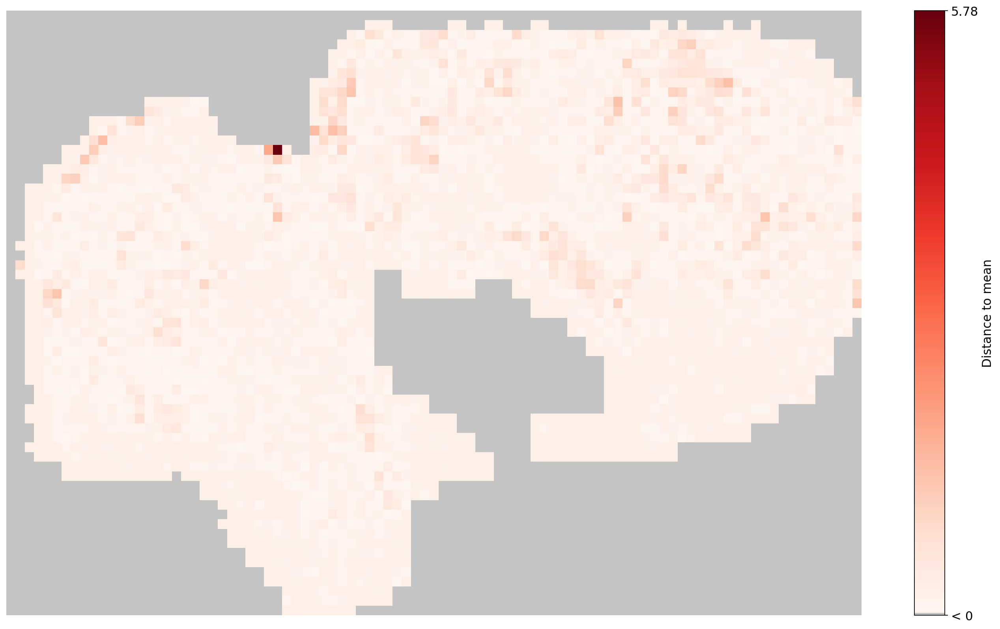

In [31]:
from spatial_correlation import spatial_gene_distance_grid

# Calculate the spatial correlation of the gene expression in ST data

test_dist = spatial_gene_distance_grid(adata, "PTPRC", 1000)
print(test_dist.variance)
print(test_dist.global_mean)
test_dist.plot_distance(cmap="Reds")


In [16]:
gene_names = adata.var_names.tolist()

top_genes_dict = {'000': 0}
minmax_gene, minmax_gene_var = '000', 0

for gene in gene_names:
    dist = spatial_gene_distance_grid(adata, gene, 1000)
    var = dist.variance
    if len(top_genes_dict) < 12:
        top_genes_dict[gene] = var
        if var < minmax_gene_var:
            minmax_gene, minmax_gene_var = gene, var
    else:
        if var > minmax_gene_var:
            top_genes_dict.pop(minmax_gene)
            top_genes_dict[gene] = var
            # gets the new minmax gene from the top 10
            minmax_gene = min(top_genes_dict, key=top_genes_dict.get)
            minmax_gene_var = top_genes_dict[minmax_gene]

top_genes = list(top_genes_dict.keys())




In [17]:
print(top_genes)

['YAP1', 'ITGB1', 'HIF1A', 'PKM', 'CTNNB1', 'STAT1', 'MKI67', 'VEGFA', 'HDAC1', 'FN1', 'WWTR1', 'TGFBI']


1.825094720455675
3.2573824400906015


(<Figure size 1388x816 with 2 Axes>,
 <Axes: >,
 <matplotlib.image.AxesImage at 0x715a03dbb670>)

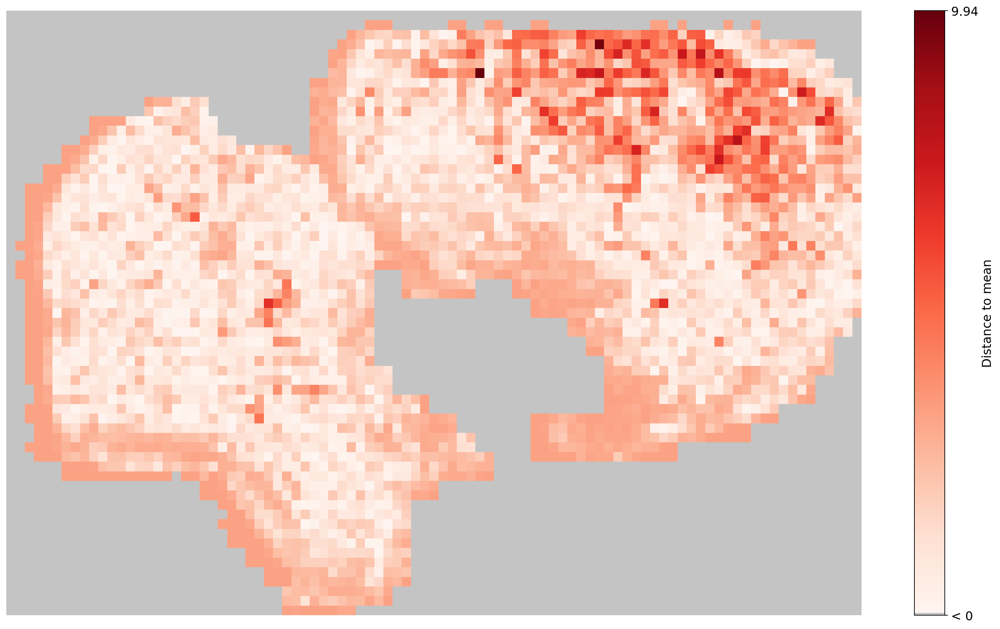

In [33]:
dist = spatial_gene_distance_grid(adata, "HIF1A", 1000)
print(dist.variance)
print(dist.global_mean)
dist.plot_distance(cmap="Reds")

YAP1 with variance 1.6498884664793174
ITGB1 with variance 6.053724469392545
HIF1A with variance 1.825094720455675
PKM with variance 66.77704103818121
CTNNB1 with variance 1.815953379878515
STAT1 with variance 1.5371469101759025
MKI67 with variance 1.5230772010916827
VEGFA with variance 5.8739748705312955
HDAC1 with variance 1.714628516364452
FN1 with variance 25.521620802805327
WWTR1 with variance 2.3116648525644883
TGFBI with variance 4.636584945836258


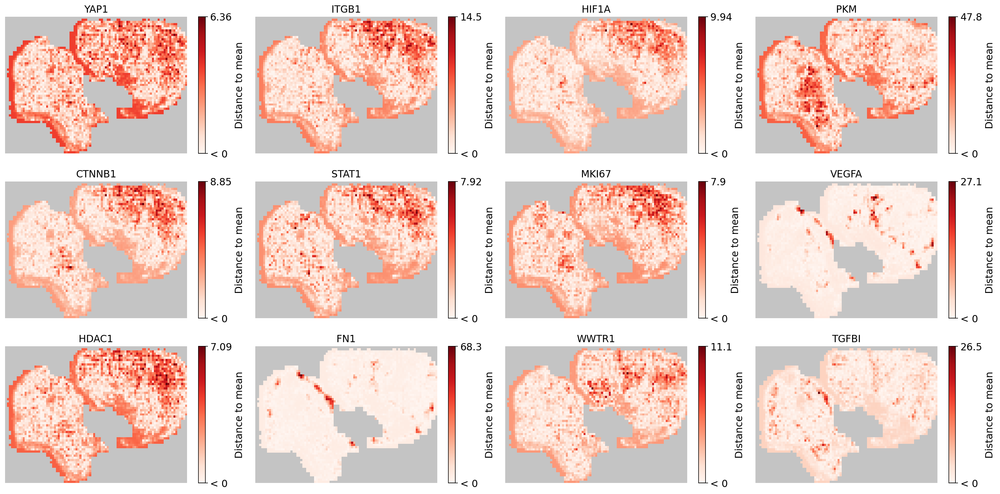

In [19]:
list_of_grids = []
for gene in top_genes:
    dist = spatial_gene_distance_grid(adata, gene, 1000)
    list_of_grids.append(dist)

# Plot all grids in a single figure
fig, axes = plt.subplots(3, 4, figsize=(20, 10))
axes = axes.ravel()

for i, dist in enumerate(list_of_grids):

    dist.plot_distance(ax=axes[i], cmap="Reds")
    axes[i].set_title(f"{top_genes[i]}")
    axes[i].axis('off')
    print(f"{top_genes[i]} with variance {dist.variance}")

plt.tight_layout()
plt.show()

In [28]:
low_genes_dict = {'ttt': 10000}
maxmin_gene, maxmin_gene_var = 'ttt', 10000

for gene in gene_names:
    dist = spatial_gene_distance_grid(adata, gene, 1000)
    var = dist.variance
    if len(low_genes_dict) < 12:
        low_genes_dict[gene] = var
        if var > maxmin_gene_var:
            maxmin_gene, maxmin_gene_var = gene, var
    else:
        if var < maxmin_gene_var:
            low_genes_dict.pop(maxmin_gene)
            low_genes_dict[gene] = var
            # gets the new minmax gene from the top 10
            maxmin_gene = max(low_genes_dict, key=low_genes_dict.get)
            maxmin_gene_var = low_genes_dict[maxmin_gene]

top_genes = list(top_genes_dict.keys())

PLVAP with variance 4.6913281750582124e-05
CXCL5 with variance 6.193467981147651e-05
XCR1 with variance 5.959066850295205e-05
IRF5 with variance 6.133899785726012e-05
CD1B with variance 6.517970761384551e-05
NCR3 with variance 6.0828884898472105e-05
MRC1 with variance 6.728764292780443e-05
IL21 with variance 6.277833842717599e-05
FGFR2 with variance 6.775153006648328e-05
Blank-9 with variance 6.899011010094765e-05
Blank-12 with variance 5.868611205317636e-05
Blank-41 with variance 5.320655544090164e-05


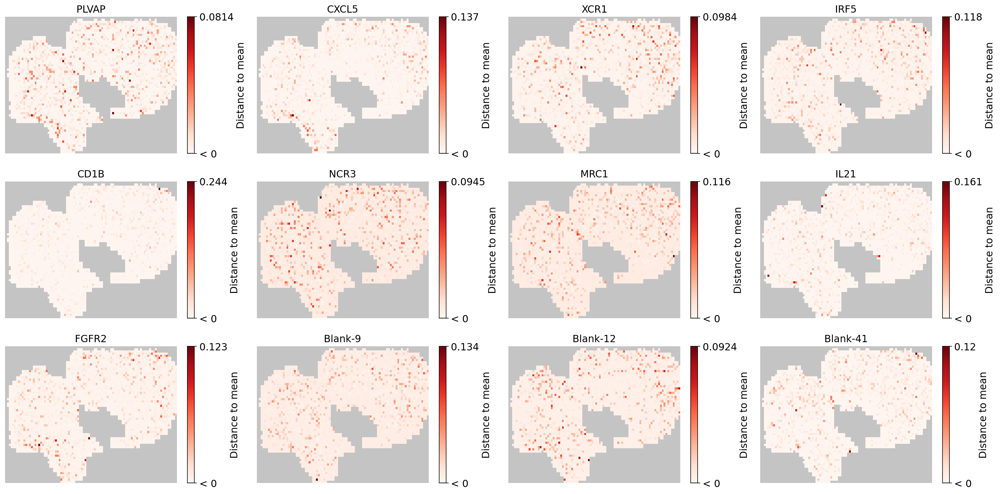

In [29]:
low_genes = list(low_genes_dict.keys())

list_of_grids = []
for gene in low_genes:
    dist = spatial_gene_distance_grid(adata, gene, 1000)
    list_of_grids.append(dist)

# Plot all grids in a single figure
fig, axes = plt.subplots(3, 4, figsize=(20, 10))
axes = axes.ravel()

for i, dist in enumerate(list_of_grids):

    dist.plot_distance(ax=axes[i], cmap="Reds")
    axes[i].set_title(f"{low_genes[i]}")
    axes[i].axis('off')
    print(f"{low_genes[i]} with variance {dist.variance}")

plt.tight_layout()
plt.show()